## Import

In [4]:
import os
import sys
import numpy as np
import pandas as pd
from tqdm import tqdm

# add path to get project functions from roots
module_path = os.path.abspath(os.path.join('../../'))
if module_path not in sys.path:
    sys.path.append(module_path)
    
from utils.load_Flame import load_FLAME_csv_params

## load train data

from load_FLAME_csv_params:
categories: [Anger, Comtempt, Disgust, Fear, Happy, Neutral, Sad, Surprise]

1. Neutral = 0
2. Happy = 1
3. Anger = 2
4. Sad = 3
5. Surprise = 4
6. Fear = 5
7. Disgust = 6
8. Comptempt = 7


In [18]:
path = "/Users/michaelstettler/PycharmProjects/BVS/data/AffectNet_FLAME"
train_csv = "flame_training_params.csv"

df_train = pd.read_csv(os.path.join(path, train_csv), index_col=0)

train_data = load_FLAME_csv_params(df_train)  # all 287k+ images
#train_data = load_FLAME_csv_params(df_train.head(80000))  # 800 is fine to get 10 image for each category
print("shape train_data[0]", np.shape(train_data[0]))

shape params (287650,)


100%|██████████| 287650/287650 [00:00<00:00, 1301123.56it/s]

shape train_data[0] (287650, 50)


In [27]:
def sort_df(train_data, n_cat, n_images=10, as_mean=False):
    # declare variables
    x_train = []
    y_train = []

    # retrieve 100 images from each images
    train_x = train_data[0]
    train_y = train_data[1]
    for i in range(n_cat):
        x = train_x[train_y == i]

        if len(x) < n_images:
            print("Not enough images!")

        x_train.append(x[:n_images])
        y_train.append(np.ones(n_images)*i)

    if as_mean:
        x_train = np.mean(x_train, axis=1)
        y_train = np.arange(n_cat)
    else:
        x_train = np.reshape(x_train, (-1, np.shape(x_train)[-1]))
        y_train = np.reshape(y_train, -1)
        
    return x_train, y_train

In [28]:
n_cat = len(np.unique(train_data[1]))
print("num category:", n_cat)
print(np.unique(train_data[1]))
x_train, y_train = sort_df(train_data, n_images=3, n_cat=n_cat, as_mean=True)
print("shape x_train", np.shape(x_train))
print("shape y_train", np.shape(y_train))

num category: 8
[0 1 2 3 4 5 6 7]
shape x_train (8, 50)
shape y_train (8,)


In [29]:
# compute baselines
for i in range(n_cat):
    num_pts = len(x_train[y_train == i])
    print("num cat {}: {}, max accuracy: {}".format(i, num_pts, num_pts/len(x_train)))

num cat 0: 1, max accuracy: 0.125
num cat 1: 1, max accuracy: 0.125
num cat 2: 1, max accuracy: 0.125
num cat 3: 1, max accuracy: 0.125
num cat 4: 1, max accuracy: 0.125
num cat 5: 1, max accuracy: 0.125
num cat 6: 1, max accuracy: 0.125
num cat 7: 1, max accuracy: 0.125


## Plot

In [30]:
import matplotlib.pyplot as plt
colors = ['tab:blue', 'tab:orange', 'tab:green', 'tab:red', 'tab:purple', 'tab:brown', 'tab:cyan', 'tab:gray']

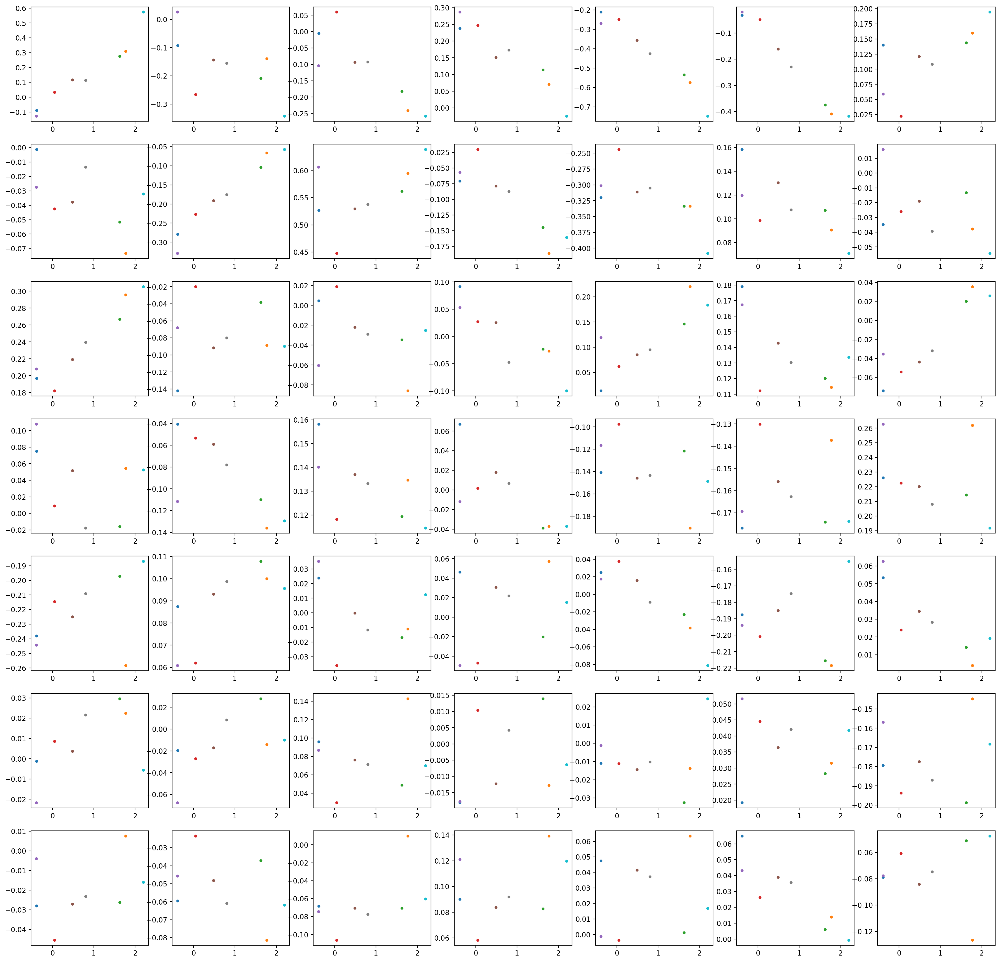

In [31]:
#x_train = train_data[0]
#y_train = train_data[1]

plt.figure(dpi=200, figsize=(25, 25))

for i in range(7):
    for j in range(7):
        plt.subplot(7, 7, i*7 + j + 1)

        for cat in range(n_cat):
            x_ = x_train[y_train == cat]
            plt.scatter(x_[:, 0], x_[:, i*7 + j + 1], s=10, color=colors[cat])
            
plt.savefig("scatter.jpg")

## fit regression

In [32]:
def fit_linear_regression(x, y, n_cat, lr=0.1, tol=1e-3, max_n_iter=5000, verbose=False):    
    # retrieve parameters
    n_dim = np.shape(x)[-1]
    # declare a set of weights for each variable
    weights = np.zeros((n_cat, n_dim))
    
    # define parameters for stopping regression
    tot_SSE = 1e10
    n_iter = 0
    
    # start regression loop
    while tot_SSE > tol and n_iter < max_n_iter:
        tot_SSE = 0 # initialize
        #compute weights for each category
        for cat in range(n_cat):
            x_ = x[y == cat]
            n_pts = np.shape(x_)[0]
            
            if n_pts > 0:
                x_train = x_[:, 0]
                x_label = x_[:, 1:]
                
                # initilaize weights of first column
                if n_iter == 0:
                    if np.mean(x_train) >= 0:
                        weights[cat, 0] = 1
                    else:
                        weights[cat, 0] = -1   
                
                # expand dims to have # (n_pts, n_dims - 1)
                x_train = np.repeat(np.expand_dims(x_train, axis=1), np.shape(x_label)[1], axis=1)  # add (n_dims - 1)
                weights_ = np.repeat(np.expand_dims(weights[cat, 1:], axis=0), len(x_), axis=0)  # add (n_pts)
                
                if verbose:
                    print("category:{} (n_pts: {})".format(cat, n_pts))
                    print("x_train", np.shape(x_train))
                    print(x_train)
                    print("x_label", np.shape(x_label))
                    print(x_label)
                    print("weights[cat]", np.shape(weights[cat]))
                    print(weights[cat])
                    print("weights_", np.shape(weights_))

                # compute predictions x^ for independent dimensions
                x_hat = x_train * weights_ / weights[cat, 0]  # (n_pts, n_dims - 1)
                
                # compute errors
                errors = np.power(x_hat - x_label, 2)
                SSE = np.sum(errors)
                errors = np.sqrt(errors)
                tot_SSE += SSE

                # compute gradient for each points
                grads = np.squeeze(np.mean(-2 * errors * x_label, axis=0))

                # update parameters
                weights[cat, 1:] -= lr / n_pts * grads
                
                if verbose:
                    print("x_hat", np.shape(x_hat))
                    print(x_hat[:, :10])
                    print("errors", np.shape(errors))
                    print(errors[:, :10])
                    print("grads", np.shape(grads))
                    print(grads[:10])
                    print("weights[cat]", np.shape(weights[cat]))
                    print(weights[cat, :10])
                    print("{} SSE:{:0.4f}, MSE:{:0.4f}".format(n_iter, SSE, np.sqrt(SSE)))                
                    print()
        
        print("{} error SSE:{:0.4f}, MSE:{:0.4f}".format(n_iter, tot_SSE, np.sqrt(tot_SSE)), end = "\r")
        n_iter += 1
        
        if n_iter >= max_n_iter:
            print("regression stoped due to max limit ({})".format(max_n_iter))
        if tot_SSE <= tol:
            print("regression reached tolerance! (in {} iteration)".format(n_iter - 1))
    
    print("Final error SSE:{:0.4f}, MSE:{:0.4f}".format(tot_SSE, np.sqrt(tot_SSE))) 
    return weights

In [33]:
ref = np.zeros(np.shape(x_train)[1])
#ref = np.mean(x_train[y_train == 0], axis=0)  # (n_dims, )
#ref = np.mean(x_train[y_train == 4], axis=0)  # (n_dims, )
print("shape ref", np.shape(ref))
x_train_ref = x_train - ref
print("x_train_ref", np.shape(x_train_ref))
w = fit_linear_regression(x_train_ref, y_train, n_cat, max_n_iter=5000, verbose=False)
print("weights", np.shape(w))

shape ref (50,)
x_train_ref (8, 50)
regression stoped due to max limit (5000)
Final error SSE:0.0011, MSE:0.0335
weights (8, 50)


## Predict tuning direction

In [34]:
# create pts along x axis
x_tun_pred = np.array([[0., 3.]]).astype(float)
x_tun_pred = np.repeat(x_tun_pred, n_cat, axis=0)  # (n_cat, n_pts)
x_tun_pred = np.repeat(np.expand_dims(x_tun_pred, axis=1), np.shape(x_train)[1], axis=1)  # add n_dims (n_cat, n_dims, n_pts)

# expand weights with n_pts dimension on axis 2
w_ = np.repeat(np.expand_dims(w, axis=2), np.shape(x_tun_pred)[2], axis=2)  # add n_pts (n_cat, n_dims, n_pts)

# predict over other dimensions (n_cat, n_dims, n_pts)
ref_rep = np.repeat(np.expand_dims(ref, axis=0), n_cat, axis=0)  # add n_cat (n_cat, n_dims)
ref_rep = np.repeat(np.expand_dims(ref_rep, axis=2), np.shape(x_tun_pred)[2], axis=2)  # add n_pts (n_cat, n_dims, n_pts)
y_tun_pred = x_tun_pred * w_ + ref_rep
print("y_tun_pred", np.shape(y_tun_pred))

y_tun_pred (8, 50, 2)


## Plot fitted tuning direction

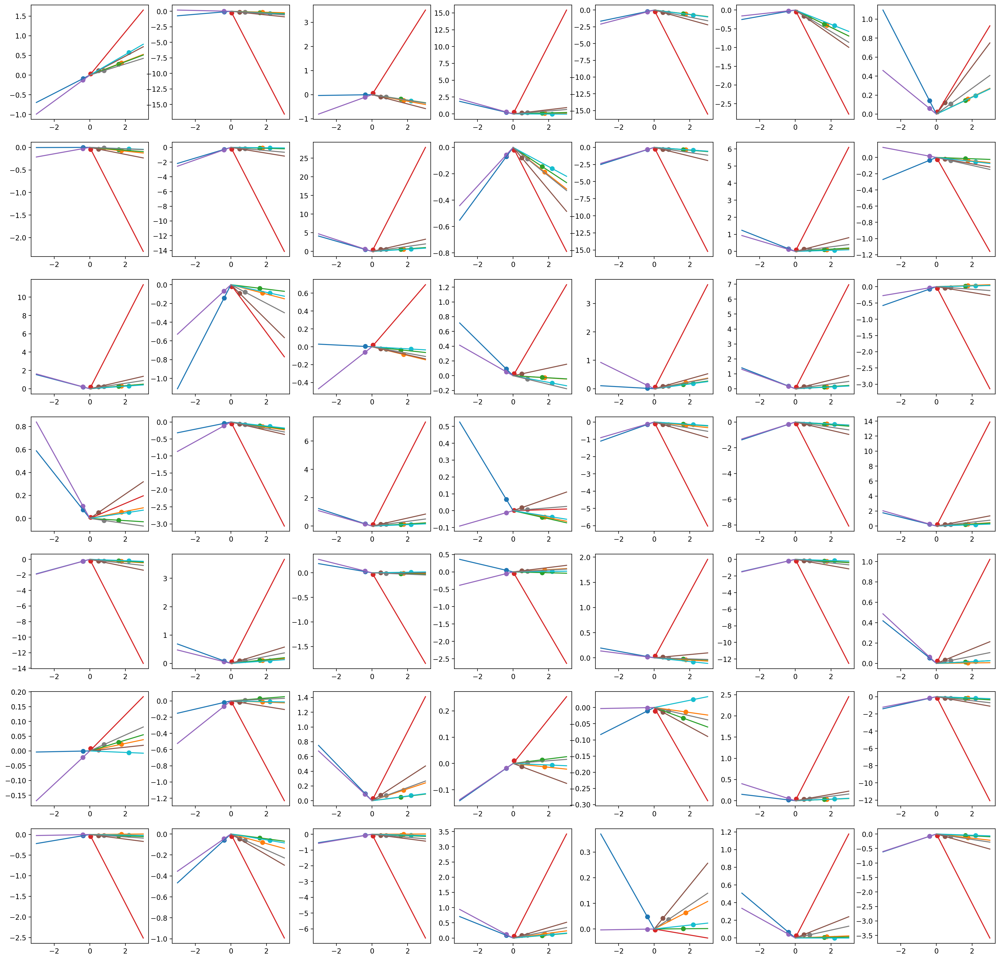

In [35]:
plt.figure(dpi=200, figsize=(25, 25))
for i in range(7):
    for j in range(7):
        dim = i*7 + j + 1
        plt.subplot(7, 7, dim)
        
        for cat in range(n_cat):
            # plot scatter data
            x_ = x_train[y_train == cat]
            plt.scatter(x_[:, 0], x_[:, dim], color=colors[cat])
            
            # plot fitted tuning direction
            plt.plot(y_tun_pred[cat, 0], y_tun_pred[cat, dim], color=colors[cat])
plt.savefig("fitted_t_direction_10cat_FLAME.jpeg")

## apply ref-based classifier

In [36]:
def ref_base_classifier(r, t, x_test, verbose=False):
    # control that tuing vector is a correct size
    if len(np.shape(t)) != 2:
        if len(np.shape(t)) == 1:
            t = np.expand_dims(t, axis=0)
        else:
            print("tuning direction vector is not dim 2!")
            
    # control that tuning vectors and x_test have same dimensions
    if np.shape(t)[1] != np.shape(x_test)[1]:
        raise ValueError("tuning dims and x_test does not have similar dimensions ({} vs. {})".format(np.shape(t)[1], np.shape(x_test)[1]))
    
    # create unity vectors
    t_unit = t / np.repeat(np.expand_dims(np.linalg.norm(t, axis=1), axis=1), np.shape(t)[1], axis=1)
    
    # compute diff from ref
    diff = x_test - r
    
    # compute scalar proj
    proj = x_test @ t_unit.T
    
    if verbose:
        print("proj", np.shape(proj))
        print(proj)
    
    # ReLu activation
    proj[proj < 0] = 0
    
    return proj

## Predict test case

In [37]:
test_csv = "flame_validation_params.csv"

df_test = pd.read_csv(os.path.join(path, test_csv), index_col=0)

test_data = load_FLAME_csv_params(df_test)
print("shape test_data[0]", np.shape(test_data[0]))

shape params (4000,)


100%|██████████| 4000/4000 [00:00<00:00, 1016985.88it/s]

shape test_data[0] (4000, 50)


In [38]:
#x_test, y_test = sort_df(test_data, n_images=10)
#print("shape x_test", np.shape(x_test))
#print("shape y_test", np.shape(y_test))

In [39]:
x_test = test_data[0]
y_test = test_data[1]
print("shape x_test", np.shape(x_test))
print("shape y_test", np.shape(y_test))
print("n_cat_test", n_cat_test)

shape x_test (4000, 50)
shape y_test (4000,)
n_cat_test 8
N CAT ARE not SIMILAR!!!!


In [40]:
# compute baselines
for i in range(8):
    num_pts = len(x_test[y_test == i])
    print("num cat {}: {}, max accuracy: {}".format(i, num_pts, num_pts/len(x_test)))

num cat 0: 500, max accuracy: 0.125
num cat 1: 500, max accuracy: 0.125
num cat 2: 500, max accuracy: 0.125
num cat 3: 500, max accuracy: 0.125
num cat 4: 500, max accuracy: 0.125
num cat 5: 500, max accuracy: 0.125
num cat 6: 500, max accuracy: 0.125
num cat 7: 500, max accuracy: 0.125


In [41]:
def predict(ref, t, x, neutral_cat=4, threshold=1.0):
    # predict test case
    x_pred = ref_base_classifier(ref, t, x)

    # get all idx that are lower than the threshold
    x_pred_max = np.amax(x_pred, axis=1)
    neutral_idx = np.arange(len(x_pred_max))
    neutral_idx = neutral_idx[x_pred_max < threshold]

    # retrieve max argument for the category
    x_pred = np.argmax(x_pred, axis=1)
    
    # set neutral idx
    x_pred[neutral_idx] = neutral_cat
    
    return x_pred


In [43]:
# predict test case
x_pred = predict(ref, w, x_test, neutral_cat=4, threshold=1.0)
print("x_pred", np.shape(x_pred))
print(x_pred)

x_pred (4000,)
[7 4 4 ... 2 4 7]


In [44]:
# compute accuracy
count_correct = 0
for i, pred in enumerate(x_pred):
    if pred == y_test[i]:
        count_correct += 1
        
print("accuracy:", count_correct/len(x_pred))

accuracy: 0.1685


## test 1
Using training as: 
x_train, y_train = sort_df(train_data, n_images=10, as_mean=True)

and test as: test_data(1000)

1. with ref = 0, accuracy = 20.7%
2. with ref = np.mean(x_train[y_train == 0], axis=0), accuracy = 17.3%
3. with ref = np.mean(x_train[y_train == 1], axis=0), accuracy = 18.7%
4. with ref = np.mean(x_train[y_train == 2], axis=0), accuracy = 20.2%
5. with ref = np.mean(x_train[y_train == 3], axis=0), accuracy = 17.7%
6. with ref = np.mean(x_train[y_train == 4], axis=0), accuracy = 14.4%
7. with ref = np.mean(x_train[y_train == 5], axis=0), accuracy = 18.8%
8. with ref = np.mean(x_train[y_train == 6], axis=0), accuracy = 18.7%


## Test 2
Using a threshold for minimum length of vector
Training: 
x_train, y_train = sort_df(train_data, n_images=10, as_mean=True)

Testing: 
test_data(1000)

1. with ref = 0 and t=1, accuracy = 21.4%


Testing: 
test_data(4000)
1. with ref = 0 and t=1, accuracy = 20.65%

In [ ]:
# plot test data
plt.figure(dpi=200, figsize=(25, 25))
for i in range(7):
    for j in range(7):
        dim = i*7 + j + 1
        plt.subplot(7, 7, dim)
        
        for cat in range(n_cat):
            # plot scatter data
            x_ = x_test[y_test == cat]
            plt.scatter(x_[:, 0], x_[:, dim], color=colors[cat], s=1, alpha=.5)
            
            # plot fitted tuning direction
            plt.plot(y_tun_pred[cat, 0], y_tun_pred[cat, dim], color=colors[cat])
plt.savefig("test_data_FLAME.jpeg")

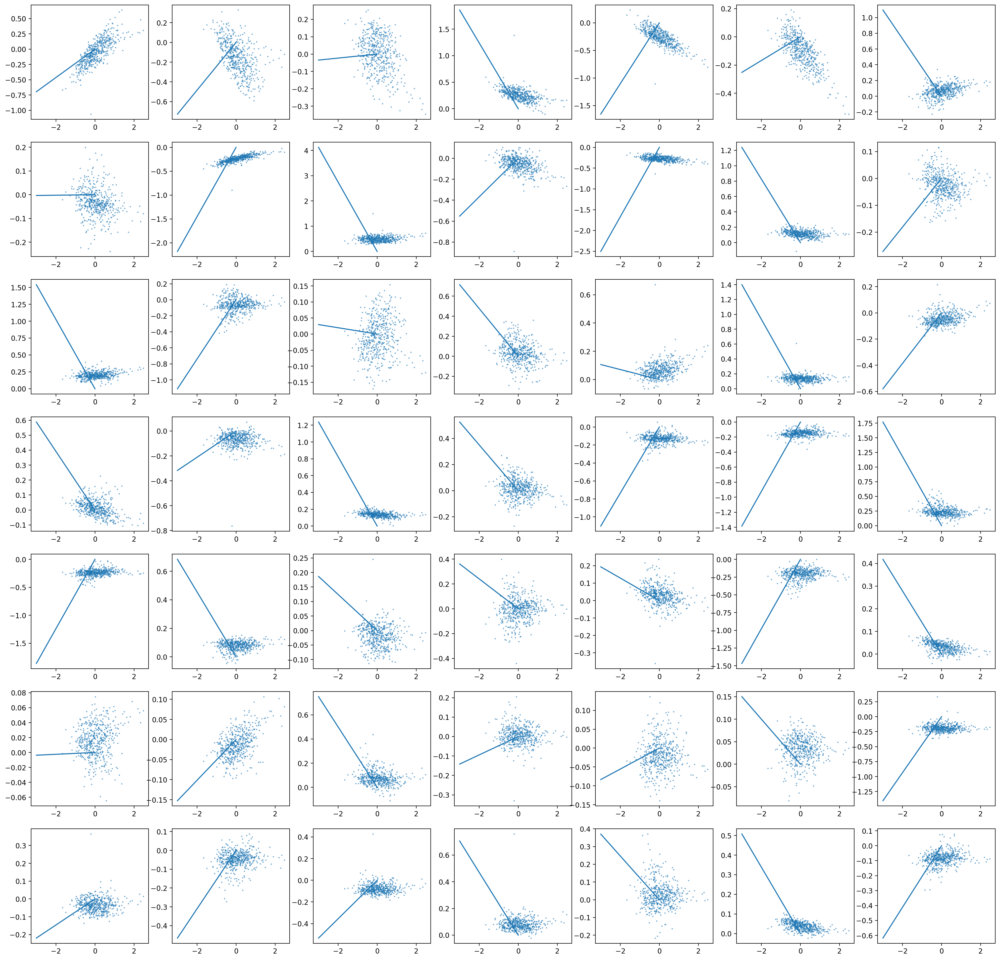

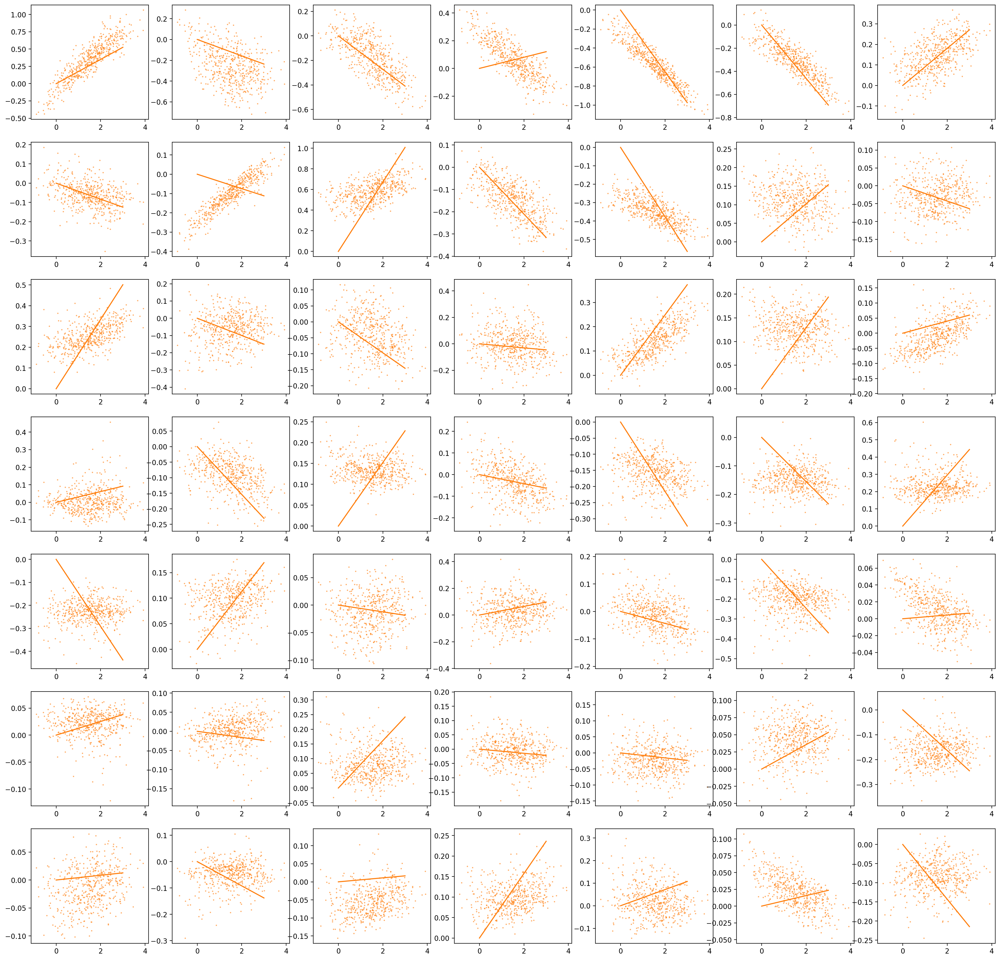

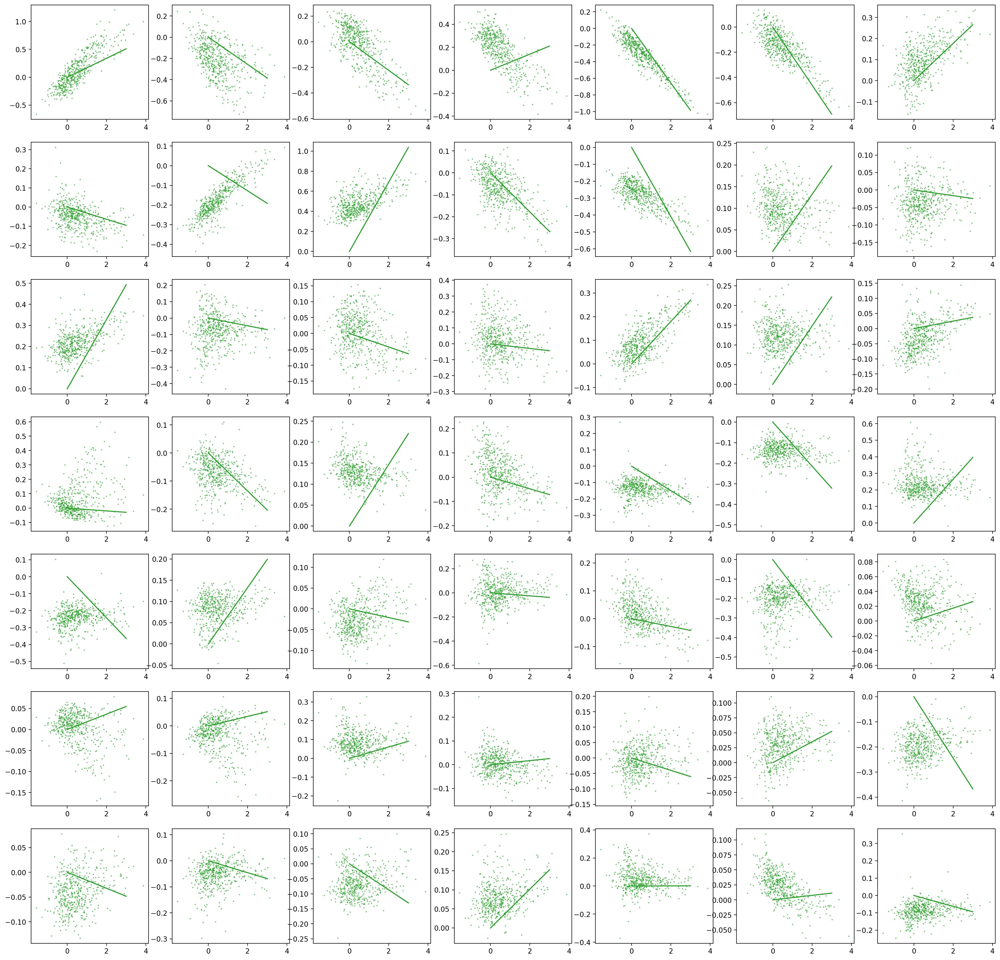

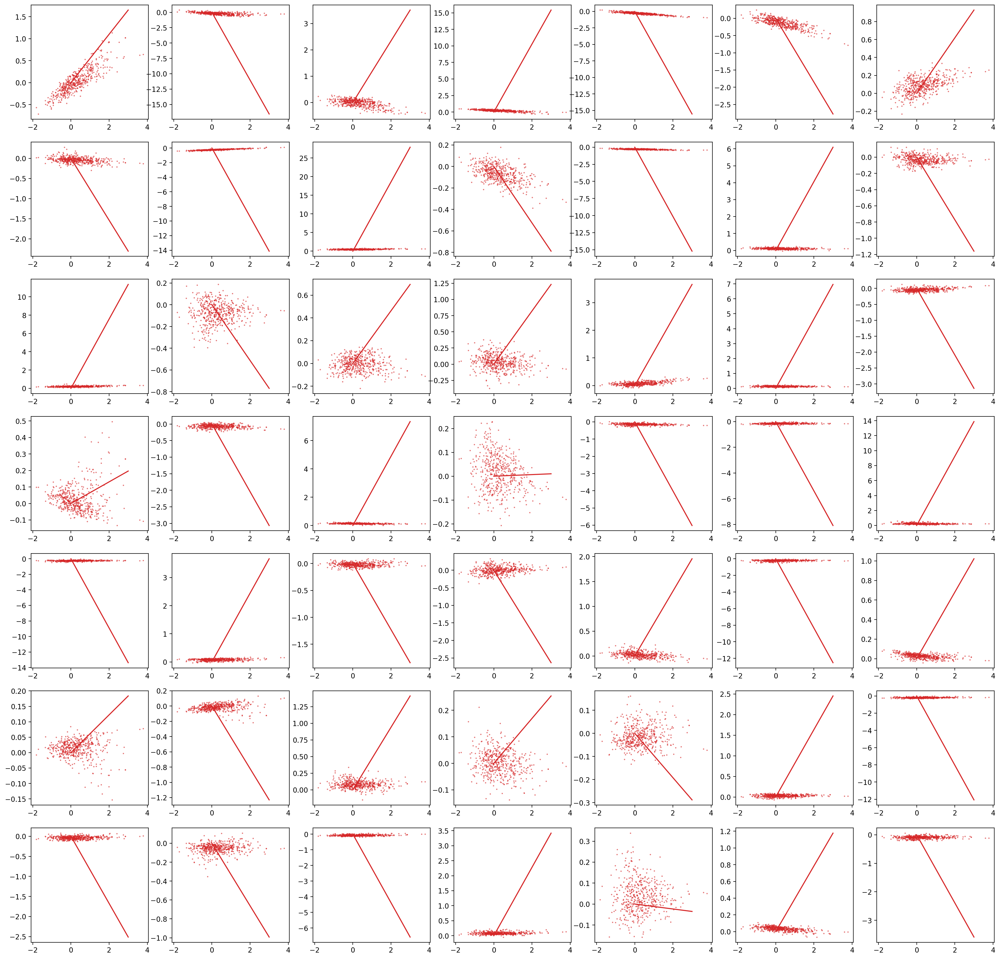

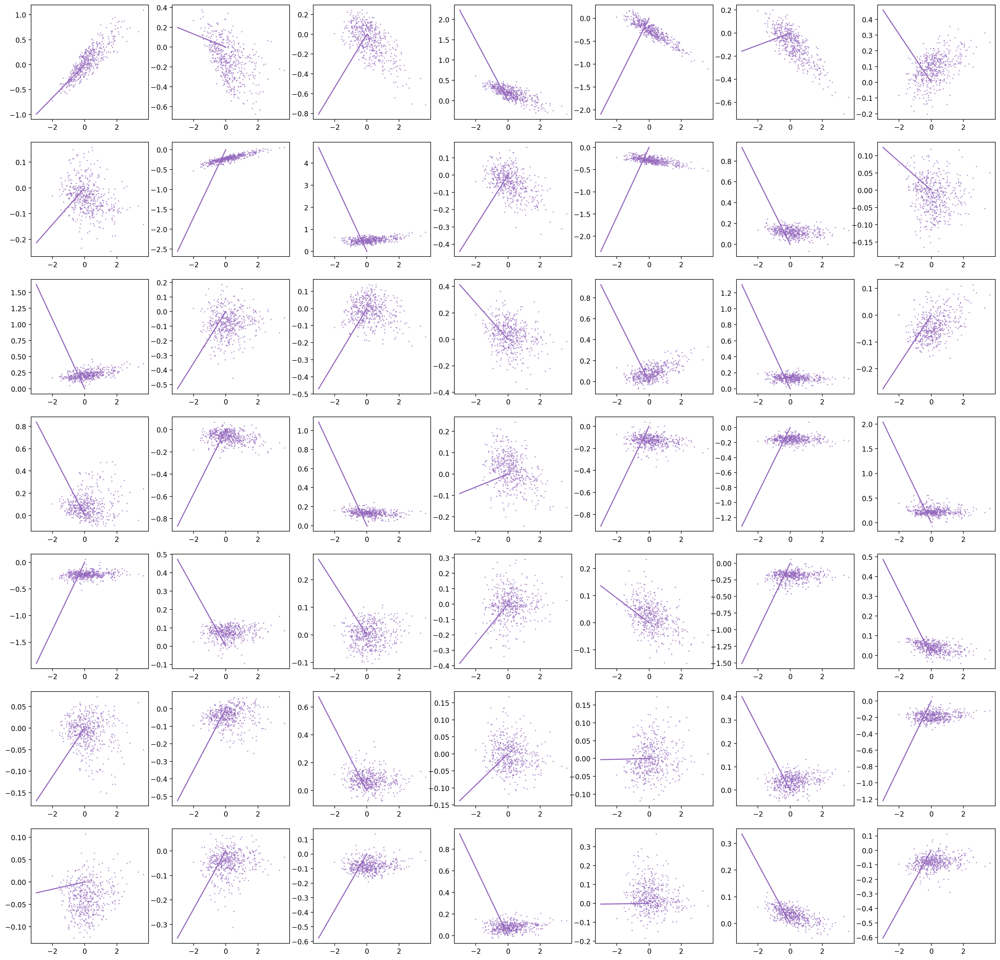

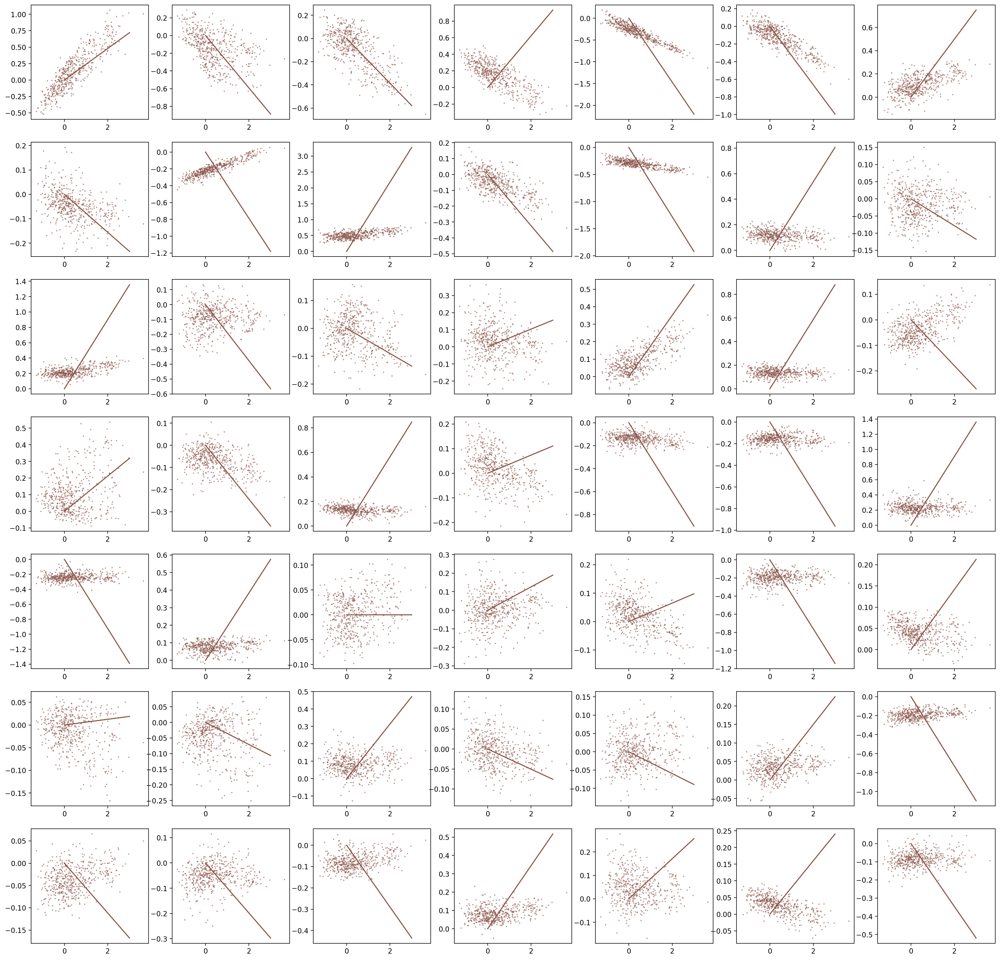

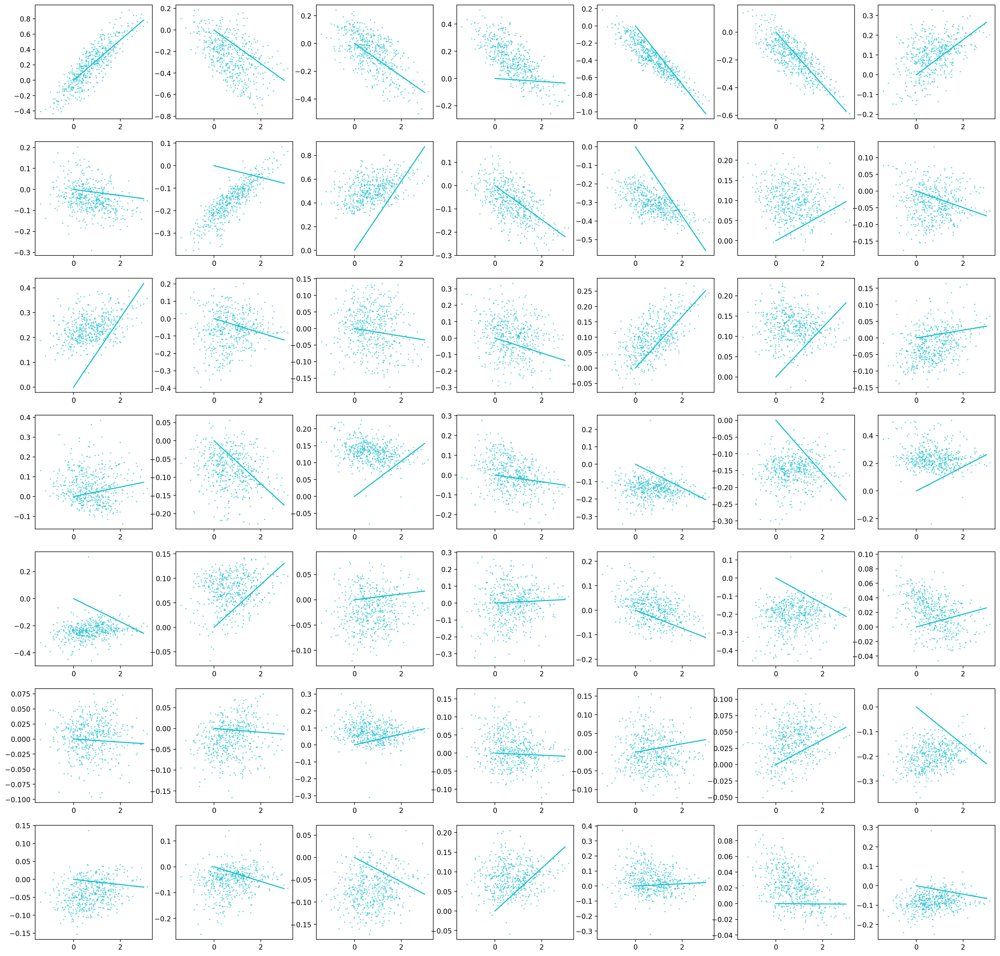

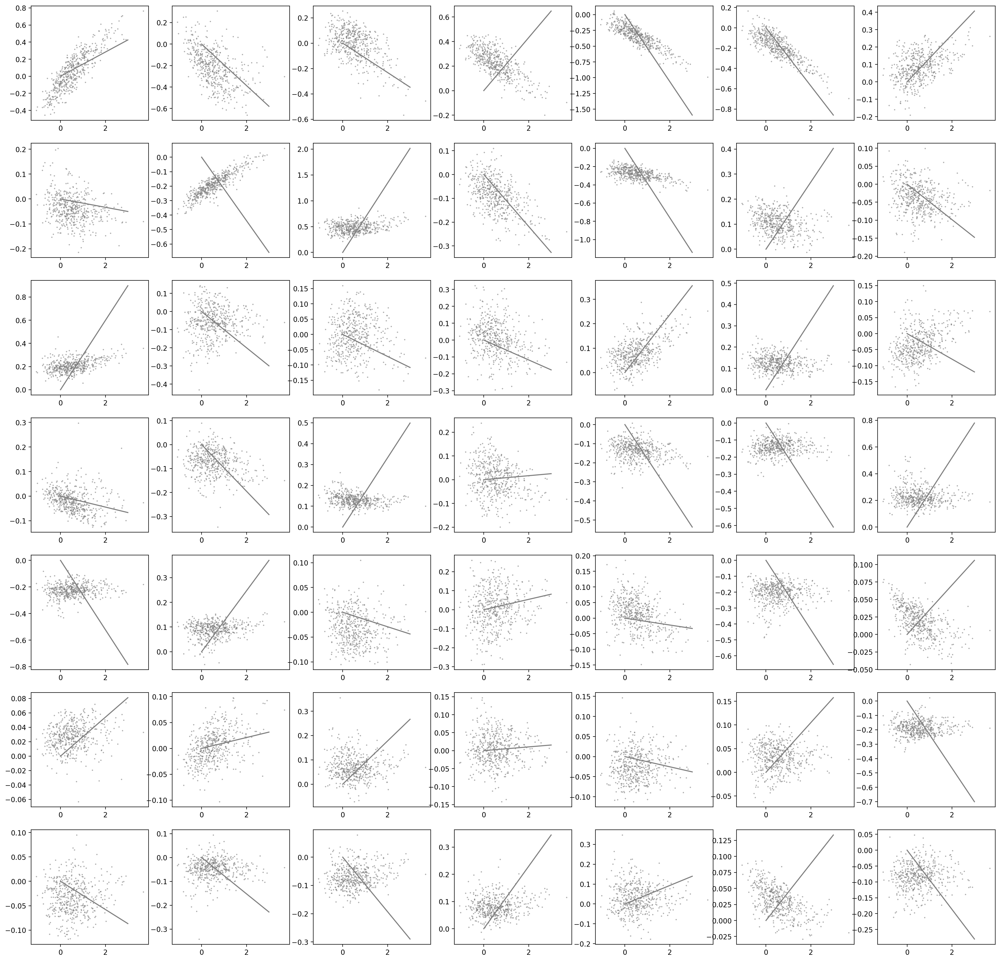

In [45]:
# plot per category
for cat in range(n_cat):
    plt.figure(dpi=200, figsize=(25, 25))
    for i in range(7):
        for j in range(7):
            dim = i*7 + j + 1
            plt.subplot(7, 7, dim)
        
            # plot scatter data
            x_ = x_test[y_test == cat]
            plt.scatter(x_[:, 0], x_[:, dim], color=colors[cat], s=1, alpha=.5)
            
            # plot fitted tuning direction
            plt.plot(y_tun_pred[cat, 0], y_tun_pred[cat, dim], color=colors[cat])
    plt.savefig("test_data_FLAME_cat_{}.jpeg".format(cat))

## Compare with computing means

In [ ]:
# first get means as direction tuning
means = []
for cat in range(n_cat):
    x_ = x_train[y_train == cat]
    print("shape x_", np.shape(x_))
    means.append(np.mean(x_, axis=0))
means = np.array(means)
print("means", np.shape(means))
# transform means to unit vectors
tun_vectors = means / np.repeat(np.expand_dims(np.linalg.norm(means, axis=1), axis=1), np.shape(means)[1], axis=1)

# predict 
ref = np.zeros(np.shape(means)[1])
predict(ref, tun_vectors, x_test, neutral_cat=4, threshold=1.0)
print("x_pred", np.shape(x_pred))
print(x_pred)

In [ ]:
# compute accuracy
count_correct = 0
for i, pred in enumerate(x_pred):
    if pred == y_test[i]:
        count_correct += 1
        
print("accuracy:", count_correct/len(x_pred))